In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sys
sys.path.append("../../")

# #spectrome modules
# from spectrome.notebooks.utils import functions, path
# from spectrome.brain import Brain
# from spectrome.forward import ntf_local_stimulus as nt_stim
# from spectrome.forward import ntf_local as nt_nostim
# from spectrome.forward import ntf_local_stimulus as nt_stim

from scipy.io import loadmat
from scipy.stats import wilcoxon
from statsmodels.stats.multitest import fdrcorrection

from scipy.io import savemat
import pickle as pkl

In [4]:
data1=loadmat("../../BRACCIO_Database_PWelch_AvgTrials_MI_RestingState_Strat2.mat")
strat_mi=data1['Avg_MI_Strat2_DK']
strat_rest=data1['Avg_RS_Strat2_DK']

##removing subjects that donot exist
remove = [2, 3, 8, 11, 15, 16]
strat_rest1 = np.delete(strat_rest, remove, axis=0)
strat_mi1 = np.delete(strat_mi, remove, axis=0)

##removing subjects that donot exist
remove2 = [68]

strat_rest2 = np.delete(strat_rest1, remove2, axis=1)
strat_mi2 = np.delete(strat_mi1, remove2, axis=1)

In [3]:
strat_mi2.shape

(26, 68, 251)

In [4]:
strat_mi=data1['Avg_MI_Strat2_DK']
strat_rest=data1['Avg_RS_Strat2_DK']

In [6]:
fvec = np.squeeze(data1['Freqs_MI_Strat2_DK'][0])[3:30]
df=pd.read_excel('../ListROIs_DK.xlsx')

In [7]:
all_regions=[]
all_regions_idx=[]
for i,r in df.iterrows():
    all_regions_idx.append(i)
    all_regions.append(r['ROI'].strip("'"))

In [8]:
##modeled data
x_mi_all={}
x_rest_all={}

num=1
x_mi_all[num]=np.zeros((68, 10, 26))
x_rest_all[num]=np.zeros((68, 10, 26))

for i in range(26):
    mi_fname = f'../../bci_results_apd/bci_results/validation/mi_allsubs_f/mi_nostim_mse_db_fvec330_{i}.p'
    with open(mi_fname, 'rb') as f:
        x_mi_all[num][:,:,i]=np.array(pkl.load(f))
    
    rest_fname = f'../../bci_results_apd/bci_results/validation/rest_allsubs_f0/rs1_nostim_mse_db_fvec330_{i}.p'
    with open(rest_fname, 'rb') as f:
        x_rest_all[num][:,:,i]=np.array(pkl.load(f))

In [9]:
x_mi_all[1].shape

(68, 10, 26)

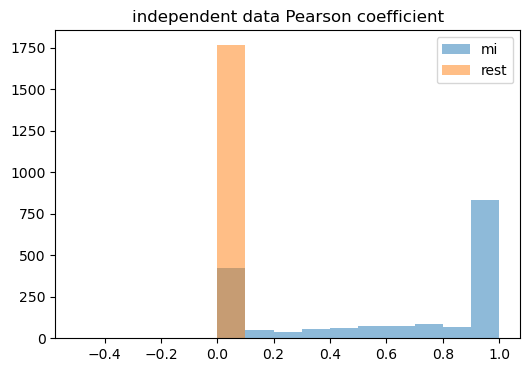

In [10]:
plt.figure(figsize=(6,4))
plt.hist(x_mi_all[1][:,4,:].flatten(), label='mi',alpha=0.5)
plt.hist(x_rest_all[1][:,4,:].flatten(), label='rest',alpha=0.5)
plt.legend()
plt.title('independent data Pearson coefficient')
plt.show()

In [11]:
##Batch-2
#to store p-values--(gei, gii, tau_e, tau_i)-across all subjects/performers
### for MI V. Rest
##for each region across subjects
sess=1
pval_all_reg_top = np.zeros((len(all_regions_idx), 4))
for i in range(len(all_regions_idx)):
    pval_all_reg_top[i,0]=wilcoxon(x_mi_all[sess][all_regions_idx[i],0, 11:],x_rest_all[sess][all_regions_idx[i],0,11:])[1] #gei
    pval_all_reg_top[i,1]=wilcoxon(x_mi_all[sess][all_regions_idx[i],1, 11:],x_rest_all[sess][all_regions_idx[i],1,11:])[1] #gii
    pval_all_reg_top[i,2]=wilcoxon(x_mi_all[sess][all_regions_idx[i],2,11:],x_rest_all[sess][all_regions_idx[i],2,11:])[1] #tau_e
    pval_all_reg_top[i,3]=wilcoxon(x_mi_all[sess][all_regions_idx[i],3,11:],x_rest_all[sess][all_regions_idx[i],3,11:])[1] #tau_i

# FDR-corrected p-values 
pfdr=np.zeros((len(all_regions_idx), 4))
for i in range(4):
    pfdr[:,i]=fdrcorrection(pval_all_reg_top[:, i])[1]

significant_gei= np.where(pfdr[:,0]<0.05)[0]
significant_gii= np.where(pfdr[:,1]<0.05)[0]
significant_tau_e= np.where(pfdr[:,2]<0.05)[0]
significant_tau_i= np.where(pfdr[:,3]<0.05)[0]

print("Significant ROIs for gei (pfdr <0.01):", [all_regions[i] for i in significant_gei])
print("Significant ROIs for gii (pfdr < 0.05):", [all_regions[i] for i in significant_gii])
print("Significant ROIs for tau_e (pfdr < 0.05):", [all_regions[i] for i in significant_tau_e])
print("Significant ROIs for tau_i (pfdr < 0.05):", [all_regions[i]  for i in significant_tau_i])

print(significant_gii.shape,significant_tau_e.shape)

#FDR-corrected p-values matrix for inspection
# print("FDR Corrected p-values matrix for Top Performers:\n", pfdr)

Significant ROIs for gei (pfdr <0.01): []
Significant ROIs for gii (pfdr < 0.05): ['caudalanteriorcingulate L', 'caudalanteriorcingulate R', 'caudalmiddlefrontal L', 'caudalmiddlefrontal R', 'cuneus L', 'entorhinal L', 'frontalpole L', 'fusiform L', 'fusiform R', 'inferiorparietal L', 'inferiortemporal L', 'inferiortemporal R', 'insula R', 'isthmuscingulate L', 'isthmuscingulate R', 'lateraloccipital R', 'lateralorbitofrontal R', 'lingual R', 'medialorbitofrontal L', 'medialorbitofrontal R', 'parahippocampal L', 'parahippocampal R', 'parsopercularis R', 'parsorbitalis L', 'parsorbitalis R', 'parstriangularis L', 'parstriangularis R', 'posteriorcingulate L', 'posteriorcingulate R', 'precuneus L', 'precuneus R', 'rostralanteriorcingulate L', 'superiorfrontal R', 'superiorparietal L', 'superiorparietal R', 'superiortemporal R', 'supramarginal R', 'temporalpole L', 'transversetemporal R']
Significant ROIs for tau_e (pfdr < 0.05): []
Significant ROIs for tau_i (pfdr < 0.05): []
(39,) (0,)


In [12]:
##Batch-1
#to store p-values--(gei, gii, tau_e, tau_i)-across all subjects/performers
### for MI V. Rest
##for each region across subjects
sess=1
pval_all_reg_top = np.zeros((len(all_regions_idx), 4))
for i in range(len(all_regions_idx)):
    pval_all_reg_top[i,0]=wilcoxon(x_mi_all[sess][all_regions_idx[i],0, :10],x_rest_all[sess][all_regions_idx[i],0,:10])[1] #gei
    pval_all_reg_top[i,1]=wilcoxon(x_mi_all[sess][all_regions_idx[i],1, :10],x_rest_all[sess][all_regions_idx[i],1,:10])[1] #gii
    pval_all_reg_top[i,2]=wilcoxon(x_mi_all[sess][all_regions_idx[i],2,:10],x_rest_all[sess][all_regions_idx[i],2,:10])[1] #tau_e
    pval_all_reg_top[i,3]=wilcoxon(x_mi_all[sess][all_regions_idx[i],3,:10],x_rest_all[sess][all_regions_idx[i],3,:10])[1] #tau_i

# FDR-corrected p-values 
pfdr=np.zeros((len(all_regions_idx), 4))
for i in range(4):
    pfdr[:,i]=fdrcorrection(pval_all_reg_top[:, i])[1]

significant_gei= np.where(pfdr[:,0]<0.05)[0]
significant_gii= np.where(pfdr[:,1]<0.05)[0]
significant_tau_e= np.where(pfdr[:,2]<0.05)[0]
significant_tau_i= np.where(pfdr[:,3]<0.05)[0]

print("Significant ROIs for gei (pfdr <0.01):", [all_regions[i] for i in significant_gei])
print("Significant ROIs for gii (pfdr < 0.05):", [all_regions[i] for i in significant_gii])
print("Significant ROIs for tau_e (pfdr < 0.05):", [all_regions[i] for i in significant_tau_e])
print("Significant ROIs for tau_i (pfdr < 0.05):", [all_regions[i]  for i in significant_tau_i])

print(significant_gii.shape,significant_tau_e.shape)

#FDR-corrected p-values matrix for inspection
# print("FDR Corrected p-values matrix for Top Performers:\n", pfdr)

Significant ROIs for gei (pfdr <0.01): []
Significant ROIs for gii (pfdr < 0.05): []
Significant ROIs for tau_e (pfdr < 0.05): []
Significant ROIs for tau_i (pfdr < 0.05): []
(0,) (0,)


In [20]:
x_mi_all[1][:,:,11:].shape

(68, 10, 15)

In [17]:
good_list=[1,8,9,16,17,19,25]
bad_list=[]
for num in range(26):
    if num not in good_list:
        bad_list.append(num)

In [13]:
##Batch-1 & 2(good subjects)
#to store p-values--(gei, gii, tau_e, tau_i)-across all subjects/performers
### for MI V. Rest
##for each region across subjects
sess=1
pval_all_reg_top = np.zeros((len(all_regions_idx), 4))
for i in range(len(all_regions_idx)):
    pval_all_reg_top[i,0]=wilcoxon(x_mi_all[sess][all_regions_idx[i],0, :],x_rest_all[sess][all_regions_idx[i],0,:])[1] #gei
    pval_all_reg_top[i,1]=wilcoxon(x_mi_all[sess][all_regions_idx[i],1, :],x_rest_all[sess][all_regions_idx[i],1,:])[1] #gii
    pval_all_reg_top[i,2]=wilcoxon(x_mi_all[sess][all_regions_idx[i],2,:],x_rest_all[sess][all_regions_idx[i],2,:])[1] #tau_e
    pval_all_reg_top[i,3]=wilcoxon(x_mi_all[sess][all_regions_idx[i],3,:],x_rest_all[sess][all_regions_idx[i],3,:])[1] #tau_i

#FDR-corrected p-values 
pfdr=np.zeros((len(all_regions_idx), 4))
for i in range(4):
    pfdr[:,i]=fdrcorrection(pval_all_reg_top[:, i])[1]

significant_gei= np.where(pfdr[:,0]<0.05)[0]
significant_gii= np.where(pfdr[:,1]<0.05)[0]
significant_tau_e= np.where(pfdr[:,2]<0.05)[0]
significant_tau_i= np.where(pfdr[:,3]<0.05)[0]

print("Significant ROIs for gei (pfdr<0.01):", [all_regions[i] for i in significant_gei])
print("Significant ROIs for gii (pfdr<0.05):", [all_regions[i] for i in significant_gii])
print("Significant ROIs for tau_e (pfdr<0.05):", [all_regions[i] for i in significant_tau_e])
print("Significant ROIs for tau_i (pfdr<0.05):", [all_regions[i]  for i in significant_tau_i])

print(significant_gii.shape,significant_tau_e.shape)

#FDR-corrected p-values matrix for inspection
# print("FDR Corrected p-values matrix for Top Performers:\n", pfdr)

Significant ROIs for gei (pfdr<0.01): []
Significant ROIs for gii (pfdr<0.05): ['bankssts L', 'caudalanteriorcingulate L', 'caudalanteriorcingulate R', 'caudalmiddlefrontal L', 'caudalmiddlefrontal R', 'cuneus L', 'cuneus R', 'entorhinal L', 'frontalpole L', 'frontalpole R', 'fusiform L', 'fusiform R', 'inferiorparietal L', 'inferiortemporal L', 'inferiortemporal R', 'insula L', 'insula R', 'isthmuscingulate L', 'isthmuscingulate R', 'lateraloccipital L', 'lateraloccipital R', 'lateralorbitofrontal L', 'lateralorbitofrontal R', 'lingual L', 'lingual R', 'medialorbitofrontal L', 'medialorbitofrontal R', 'middletemporal R', 'parahippocampal L', 'parahippocampal R', 'parsopercularis L', 'parsopercularis R', 'parsorbitalis L', 'parsorbitalis R', 'parstriangularis L', 'parstriangularis R', 'pericalcarine L', 'pericalcarine R', 'postcentral L', 'postcentral R', 'posteriorcingulate L', 'posteriorcingulate R', 'precuneus L', 'precuneus R', 'rostralanteriorcingulate L', 'rostralanteriorcingulat

In [75]:
print(strat_mi2.shape, x_mi_all[1].shape)

(26, 68, 251) (68, 10, 26)


In [25]:
# ##plotting
# # region_idx=22

# for region_idx in all_regions_idx:
#     fig, ax = plt.subplots(1, 2,figsize=(10, 4))

#     col_rs1 = "blue"
#     col_mi = "red"

#     for i in range(26):
#         ax[0].plot(fvec, 10*np.log10((strat_rest2)[i, region_idx ,3:30]),color=col_rs1,alpha=0.1)
#     spectra_eeg_rs1 = 10*np.log10(np.mean(((strat_rest2)[:, region_idx ,3:30]),axis=0))
#     ax[0].plot(fvec,spectra_eeg_rs1,color=col_rs1,label='Rest',linewidth=2)    


#     for i in range(26):
#         ax[0].plot(fvec, 10*np.log10((strat_mi2)[i, region_idx ,3:30]),color=col_mi,alpha=0.1)
#     spectra_eeg_mi = 10*np.log10(np.mean(((strat_mi2)[:, region_idx ,3:30]),axis=0))
#     ax[0].plot(fvec,spectra_eeg_mi,color=col_mi,label='MI',linewidth=2)


#     ax[0].legend(fontsize=15)


#     spectra_sgm_rs1 = np.zeros((27))
#     spectra_sgm_mi = np.zeros((27))

#     for i in range(26):
#         params = {
#             "gei": x_rest_all[1][region_idx,0,i],
#             "gii": x_rest_all[1][region_idx,1,i],
#             "tau_e": x_rest_all[1][region_idx,2,i]/1000,
#             "tau_i": x_rest_all[1][region_idx,3,i]/1000,
#             "pw": x_rest_all[1][region_idx,4,i]
#         }
#         pw = 1
#         Htotal = nt_nostim.ntf_local(params,fvec)
#         ax[1].plot(fvec,pw*functions.mag2db(Htotal),color=col_rs1,alpha=0.1)
#         spectra_sgm_rs1 += pw*functions.mag2db(Htotal)/19

#     ax[1].plot(fvec,spectra_sgm_rs1,color=col_rs1,linewidth=2)

#     for i in range(19):
#         params = {
#             "gei": x_mi_all[1][region_idx,0,i],
#             "gii": x_mi_all[1][region_idx,1,i],
#             "tau_e": x_mi_all[1][region_idx,2,i]/1000,
#             "tau_i": x_mi_all[1][region_idx,3,i]/1000,
#             "pw": x_mi_all[1][region_idx,4,i]
#         }
#         pw=1
#         # pw = x_mi_nostim[all_regions[i],4]
#         Htotal = nt_nostim.ntf_local(params,fvec)
#         ax[1].plot(fvec,pw*functions.mag2db(Htotal),color=col_mi,alpha=0.1)
#         spectra_sgm_mi += pw*functions.mag2db(Htotal)/19

#     ax[1].plot(fvec,spectra_sgm_mi,color=col_mi,linewidth=2)
    

In [19]:
strat_rest2.shape

(26, 68, 251)

In [20]:
x_mi_all[1].shape

(68, 10, 26)

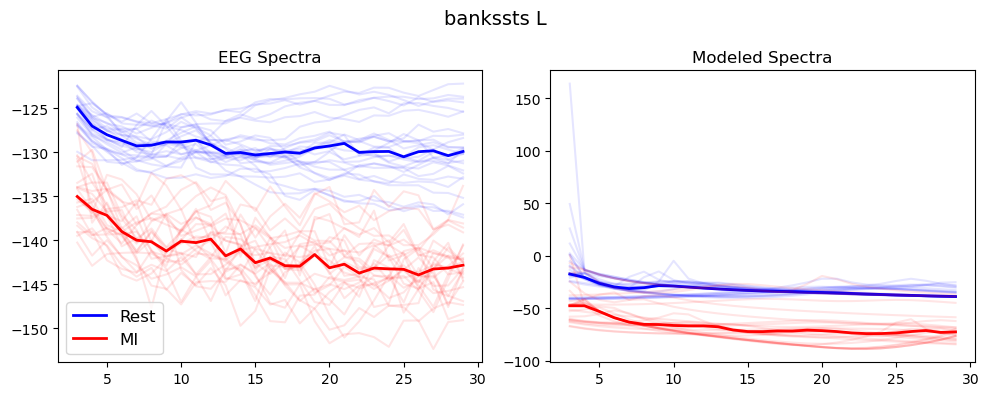

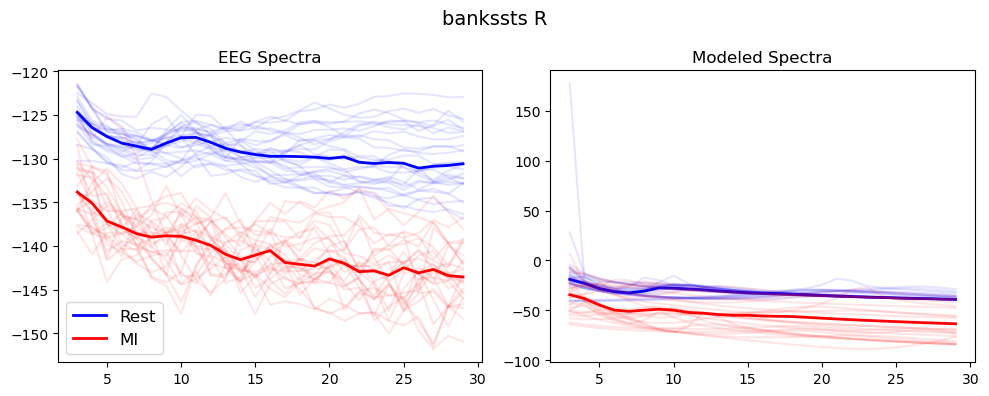

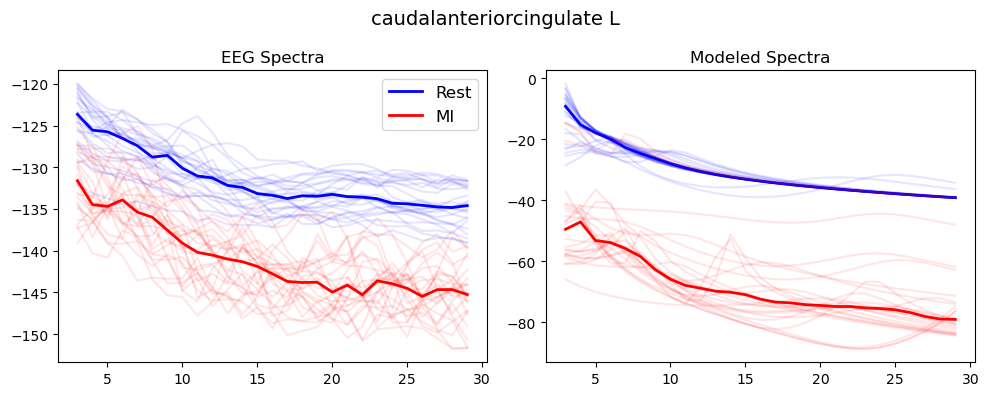

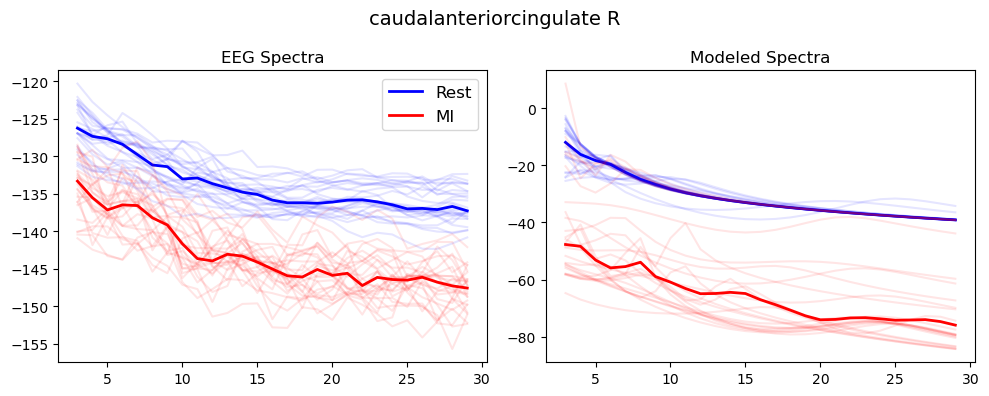

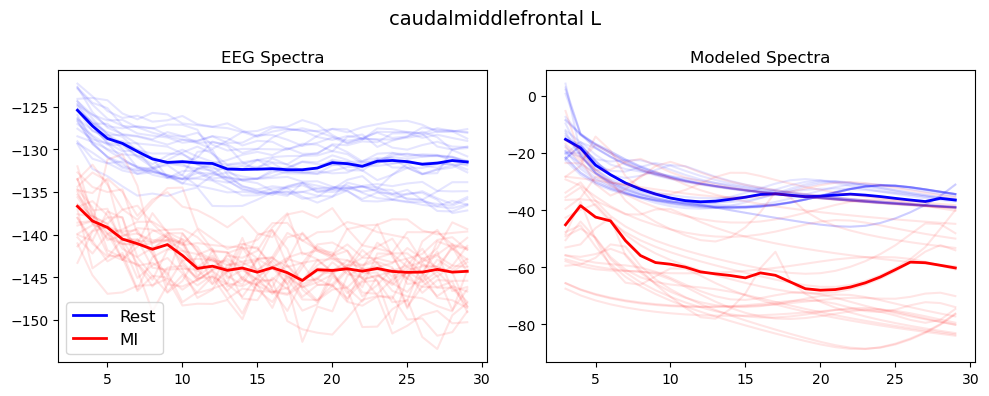

...

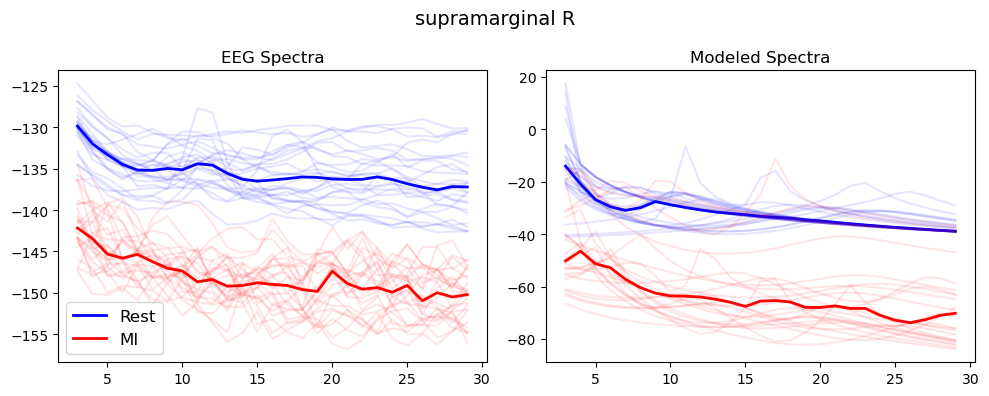

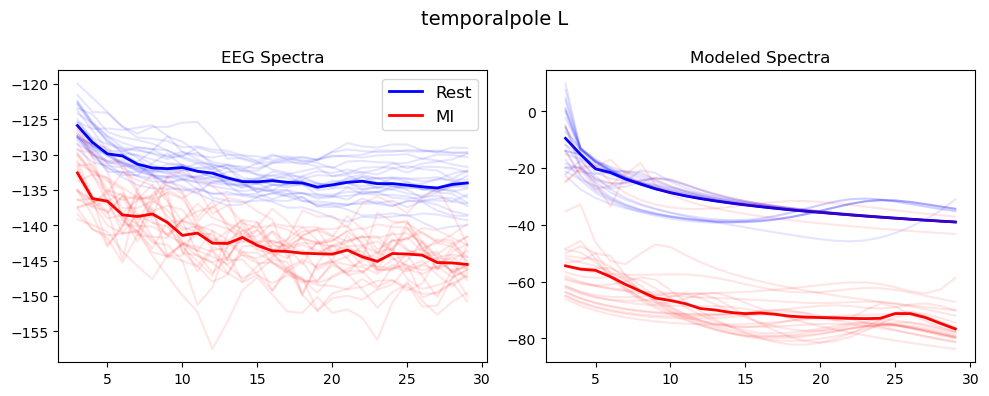

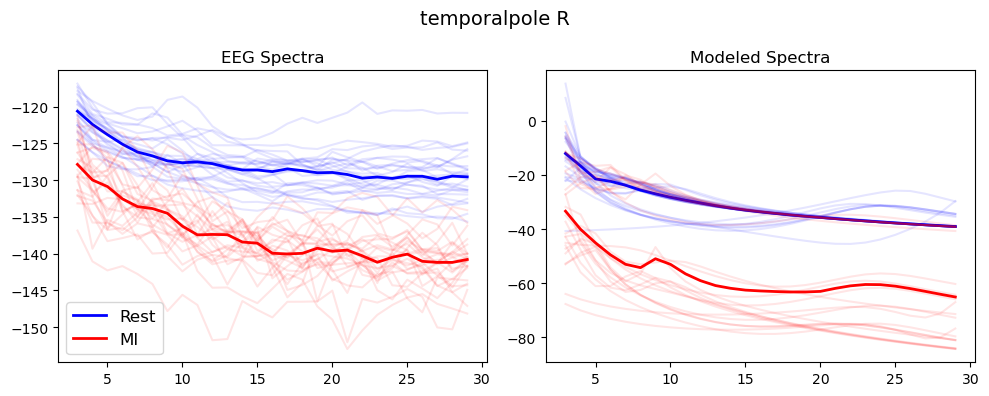

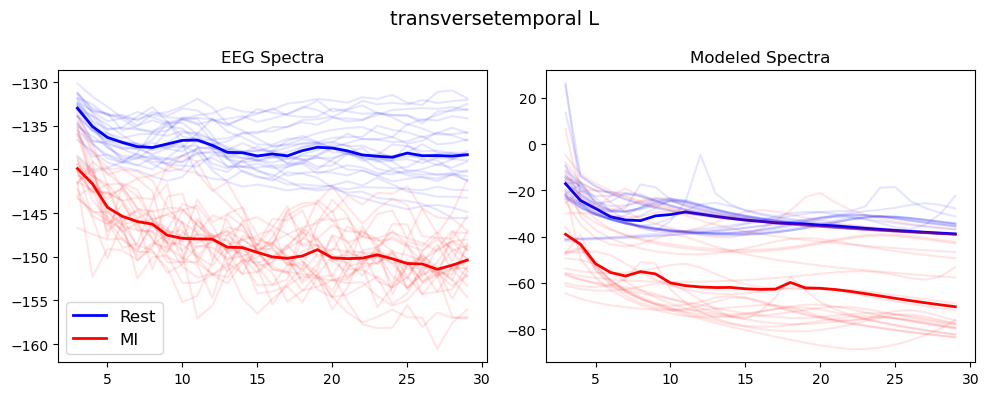

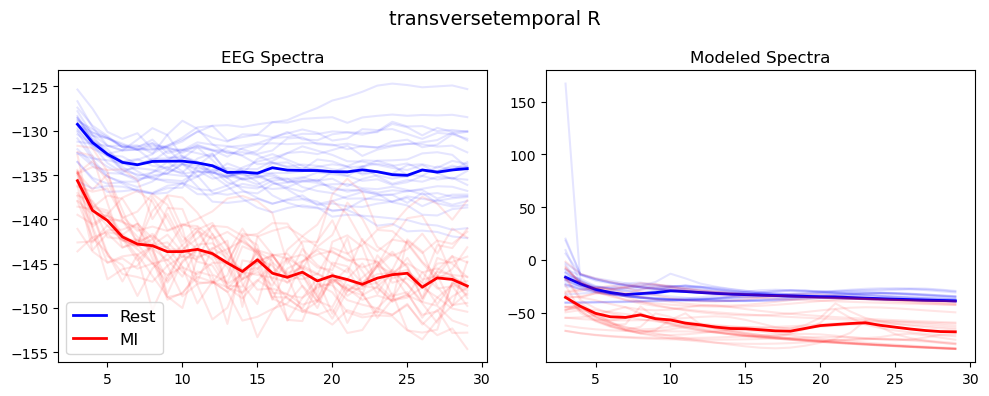

In [ ]:

for region_idx, region_name in zip(all_regions_idx, all_regions):
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))

    col_rs1 = "blue"
    col_mi = "red"

    for i in range(26):
        ax[0].plot(fvec, 10*np.log10(strat_rest2[i, region_idx, 3:30]), color=col_rs1, alpha=0.1)

    spectra_eeg_rs1 = 10*np.log10(np.median(strat_rest2[:, region_idx, 3:30], axis=0))
    ax[0].plot(fvec, spectra_eeg_rs1, color=col_rs1, label='Rest', linewidth=2)

    for i in range(26):
        ax[0].plot(fvec, 10*np.log10(strat_mi2[i, region_idx, 3:30]), color=col_mi, alpha=0.1)

    spectra_eeg_mi = 10*np.log10(np.median(strat_mi2[:, region_idx, 3:30], axis=0))
    ax[0].plot(fvec, spectra_eeg_mi, color=col_mi, label='MI', linewidth=2)

    ax[0].legend(fontsize=12)
    ax[0].set_title(f"EEG Spectra")

    sgm_rs1_all = []

    for i in range(26):
        params = {
            "gei": x_rest_all[1][region_idx, 0, i],
            "gii": x_rest_all[1][region_idx, 1, i],
            "tau_e": x_rest_all[1][region_idx, 2, i]/1000,
            "tau_i": x_rest_all[1][region_idx, 3, i]/1000,
            "pw": x_rest_all[1][region_idx, 4, i]
        }
        Htotal = nt_nostim.ntf_local(params, fvec)
        db_vals = functions.mag2db(Htotal)
        ax[1].plot(fvec, db_vals, color=col_rs1, alpha=0.1)
        sgm_rs1_all.append(db_vals)

    sgm_rs1_all = np.array(sgm_rs1_all)
    spectra_sgm_rs1 = np.median(sgm_rs1_all, axis=0)
    ax[1].plot(fvec, spectra_sgm_rs1, color=col_rs1, linewidth=2)


    sgm_mi_all = []

    for i in range(26):
        params = {
            "gei": x_mi_all[1][region_idx, 0, i],
            "gii": x_mi_all[1][region_idx, 1, i],
            "tau_e": x_mi_all[1][region_idx, 2, i]/1000,
            "tau_i": x_mi_all[1][region_idx, 3, i]/1000,
            "pw": x_mi_all[1][region_idx, 4, i]
        }
        Htotal = nt_nostim.ntf_local(params, fvec)
        db_vals = functions.mag2db(Htotal)
        ax[1].plot(fvec, db_vals, color=col_mi, alpha=0.1)
        sgm_mi_all.append(db_vals)

    sgm_mi_all = np.array(sgm_mi_all)
    spectra_sgm_mi = np.median(sgm_mi_all, axis=0)
    ax[1].plot(fvec, spectra_sgm_mi, color=col_mi, linewidth=2)

    ax[1].set_title("Modeled Spectra")

    plt.suptitle(region_name, fontsize=14)
    plt.tight_layout()
    plt.show()


### FOOOF Analysis

In [34]:
from fooof import FOOOF

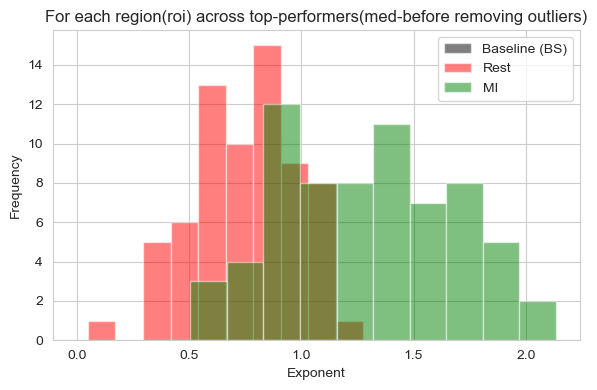

In [43]:
##For each  region across performers
reg_len =68
actual_spectra_rest=[]
actual_spectra_mi = []
actual_spectra_bs=[]
r2_rest=[]
r2_mi=[]
r2_base=[]
fit_rest=[]
fit_mi=[]
fit_base=[]

for i in range(reg_len):
    fm_rs = FOOOF(min_peak_height=0.05, verbose=False)
    spectra=np.median(strat_rest2[:,i,3:30], axis=0)
    fm_rs.fit(fvec, spectra)
    r2_rest.append(round(fm_rs.r_squared_, 4))
    fit_rest.append(round(fm_rs.error_, 4))
    rs_slope = fm_rs.get_params('aperiodic_params', 'exponent')
    actual_spectra_rest.append(rs_slope)

for i in range(reg_len):
    fm_mi = FOOOF(min_peak_height=0.05, verbose=False)
    spectra=np.median(strat_mi2[:,i, 3:30], axis=0)
    fm_mi.fit(fvec, spectra)
    r2_mi.append(round(fm_mi.r_squared_, 4))
    fit_mi.append(round(fm_mi.error_, 4))
    mi_slope = fm_mi.get_params('aperiodic_params', 'exponent')
    actual_spectra_mi.append(mi_slope)

plt.figure(figsize=(6,4))
plt.hist(actual_spectra_bs, alpha=0.5, label='Baseline (BS)', color='black')
plt.hist(actual_spectra_rest, alpha=0.5, label='Rest', color='r')
plt.hist(actual_spectra_mi, alpha=0.5, label='MI', color='green')
plt.xlabel('Exponent')
plt.ylabel('Frequency')
plt.title('For each region(roi) across top-performers(med-before removing outliers)')
plt.legend()

plt.tight_layout()
plt.show()

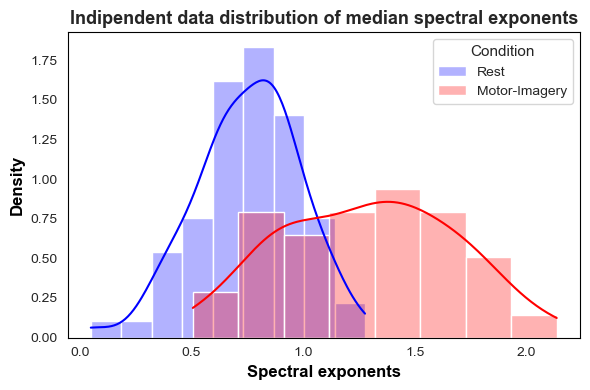

In [44]:
# sns.set_style("whitegrid")
plt.figure(figsize=(6, 4)) 

sns.histplot(actual_spectra_rest, label='Rest', color='blue', kde=True, stat='density', alpha=0.3, linewidth=1)
sns.histplot(actual_spectra_mi, label='Motor-Imagery', color='red', kde=True, stat='density', alpha=0.3, linewidth=1)

plt.xlabel('Spectral exponents', fontsize=12, fontweight='bold', color='black')
plt.ylabel('Density', fontsize=12, fontweight='bold',color='black')
plt.title('Indipendent data distribution of median spectral exponents', fontsize=13, fontweight='bold')
plt.legend(title='Condition', fontsize=10, title_fontsize=11, frameon=True)

ax = plt.gca()
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['right'].set_color('black')
# ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_color('black')

plt.grid(False)
plt.tight_layout()
plt.show()


In [45]:
np.mean(actual_spectra_rest),np.mean(actual_spectra_mi)

(0.7529595472875926, 1.2861539715708994)

In [46]:
np.mean(r2_rest), np.mean(r2_mi)

(0.8884323529411765, 0.9508838235294118)

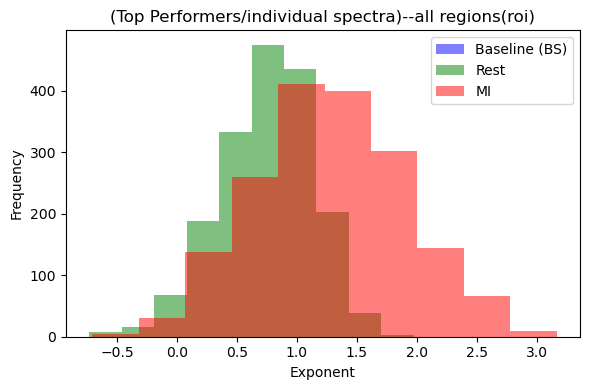

In [38]:
reg_len =68
sub_len=26
actual_spectra_rest_ind=[]
actual_spectra_base_ind=[]
actual_spectra_mi_ind=[]
r2_rest_ind=[]
r2_mi_ind=[]
r2_base_ind=[]
fit_rest_ind=[]
fit_mi_ind=[]
fit_base_ind=[]

##for each region--19 values
r2_rest_dict={i: [] for i in range(reg_len)}
r2_base_dict={i: [] for i in range(reg_len)}
r2_mi_dict={i: [] for i in range(reg_len)}

for i in range(reg_len):
    for j in range(sub_len):
        fm_rs=FOOOF(min_peak_height=0.05, verbose=False)
        spectra=strat_rest2[j,i,3:30]
        fm_rs.fit(fvec, spectra)
        r2_rest_ind.append(round(fm_rs.r_squared_, 4))
        r2_rest_dict[i].append(round(fm_rs.r_squared_, 4))
        fit_rest_ind.append(round(fm_rs.error_, 4))
        rs_slope = fm_rs.get_params('aperiodic_params', 'exponent')
        actual_spectra_rest_ind.append(rs_slope)

for i in range(reg_len):
    for j in range(sub_len):
        fm_mi=FOOOF(min_peak_height=0.05, verbose=False)
        spectra=strat_mi2[j,i,3:30]
        fm_mi.fit(fvec, spectra)
        r2_mi_ind.append(round(fm_mi.r_squared_, 4))
        r2_mi_dict[i].append(round(fm_mi.r_squared_, 4))
        fit_mi_ind.append(round(fm_mi.error_, 4))
        mi_slope = fm_mi.get_params('aperiodic_params', 'exponent')
        actual_spectra_mi_ind.append(mi_slope)

plt.figure(figsize=(6,4))
plt.hist(actual_spectra_base_ind, alpha=0.5, label='Baseline (BS)', color='b')
plt.hist(actual_spectra_rest_ind, alpha=0.5, label='Rest', color='g')
plt.hist(actual_spectra_mi_ind, alpha=0.5, label='MI', color='r')
plt.xlabel('Exponent')
plt.ylabel('Frequency')
plt.title('(Top Performers/individual spectra)--all regions(roi)')
plt.legend()

plt.tight_layout()
plt.show()

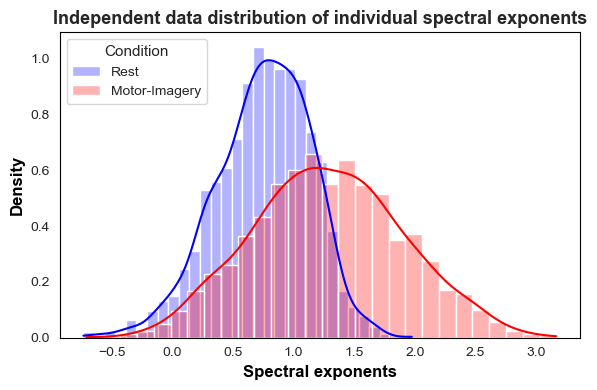

In [40]:
sns.set_style("whitegrid")
plt.figure(figsize=(6, 4)) 

sns.histplot(actual_spectra_rest_ind, label='Rest', color='blue', kde=True, stat='density', alpha=0.3, linewidth=1)
sns.histplot(actual_spectra_mi_ind, label='Motor-Imagery', color='red', kde=True, stat='density', alpha=0.3, linewidth=1)

plt.xlabel('Spectral exponents', fontsize=12, fontweight='bold', color='black')
plt.ylabel('Density', fontsize=12, fontweight='bold', color='black')
plt.title('Independent data distribution of individual spectral exponents', fontsize=13, fontweight='bold')
plt.legend(title='Condition', fontsize=10, title_fontsize=11, frameon=True, loc='upper left')

ax = plt.gca()
ax.spines['bottom'].set_color('black')
ax.spines['top'].set_color('black')
ax.spines['right'].set_color('black')
# ax.spines['bottom'].set_linewidth(1.5)
ax.spines['left'].set_color('black')

plt.grid(False)
plt.tight_layout()
plt.show()

In [41]:
np.mean(r2_rest_ind),np.mean(r2_mi_ind)

(0.8170774886877827, 0.8067855769230771)

In [42]:
np.mean(actual_spectra_rest_ind), np.mean(actual_spectra_mi_ind)

(0.75272508777394, 1.2834013748727902)